# 4. Train model. Random Forest

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path
import os

%matplotlib inline

import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
    ConfusionMatrixDisplay,
)
import joblib

from sklearn.ensemble import RandomForestClassifier
import shap
import dtreeviz
from fraudlib.utils import (
    load_features,
    pr_at_thresholds,
    cm_for_threshold,
    explain_confusion_matrix,
    thresholds_grid,
    save_model_thresholds,
)

In [ ]:
upstream = {
    'feature_engineering': {
        'train': 'data/interim/x_train_features_v2.parquet.gzip',
        'val': 'data/interim/x_val_features_v2.parquet.gzip',
        'test': 'data/interim/x_test_features_v2.parquet.gzip'
    }
}
product = None
ROOT = Path(os.path.abspath("")).resolve().parents[0]
DATA = os.path.join(ROOT, "data")
INTERIM_DATA = os.path.join(DATA, "interim")
VERSION = "v2"

## Load data

In [ ]:
X_train = pd.read_parquet(
    os.path.join(INTERIM_DATA, f"x_train_features_{VERSION}.parquet.gzip")
)
X_val = pd.read_parquet(
    os.path.join(INTERIM_DATA, f"x_val_features_{VERSION}.parquet.gzip")
)
X_test = pd.read_parquet(
    os.path.join(INTERIM_DATA, f"x_test_features_{VERSION}.parquet.gzip")
)

y_train = X_train["tx_fraud"]
y_val = X_val["tx_fraud"]
y_test = X_test["tx_fraud"]

FEATURES = load_features(
    os.path.join(INTERIM_DATA, f"features_{VERSION}.yaml")
)
FEATURES

['tx_amount',
 'sector_id',
 'tx_amount_log',
 'hour',
 'month',
 'is_month_start',
 'is_month_end',
 'is_weekend',
 'tx_amount_log_mean',
 'tx_amount_log_std',
 'tx_amount_log_deviates',
 'secs_since_prev_tx',
 'burst_id',
 'n_tx_in_burst',
 'burst_mean',
 'burst_std',
 'n_trx_per_burst_deviates',
 'hour_zscore',
 'hour_zscore_deviates',
 'rolling_median',
 'q1',
 'q3',
 'iqr',
 'amount_robust_rolling20',
 'is_amount_robust_rolling_outlier',
 'day_of_week_mean',
 'day_of_week_std',
 'is_day_of_week_mean_outlier',
 'day_of_week_zscore',
 'is_day_of_week_zscore_outlier',
 'n_tx_in_prev_24h',
 'q90_prev',
 'is_24h_burst',
 'is_24h_burst_fixed',
 'day_of_week',
 'z_in_day_robust',
 'is_anomalous_in_day',
 'fraud_burst_candidate']

## Train model

In [4]:
rf = RandomForestClassifier(
    class_weight="balanced_subsample", n_jobs=-1, random_state=42
)
rf.fit(X_train[FEATURES], y_train)
y_rf_pred_proba = rf.predict_proba(X_val[FEATURES])[:, 1]
roc_auc = roc_auc_score(y_val, y_rf_pred_proba)
pr_auc = average_precision_score(y_val, y_rf_pred_proba)

print(f"ROC AUC: {roc_auc:.3f}")
print(f"PR AUC: {pr_auc:.3f}")

ROC AUC: 0.939
PR AUC: 0.479


## Visualization

### Precision-recall curve

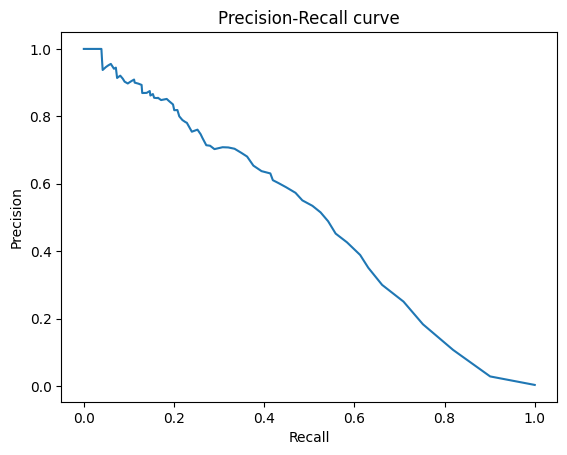

In [5]:
precision, recall, thresholds = precision_recall_curve(y_val, y_rf_pred_proba)
plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall curve")
plt.show()

## Threshold grid

In [6]:
grid_df = thresholds_grid(y_rf_pred_proba, y_val)
max_f1 = grid_df[grid_df["f1"] == grid_df["f1"].max()]
max_f05 = grid_df[grid_df["f0.5"] == grid_df["f0.5"].max()]
max_f2 = grid_df[grid_df["f2"] == grid_df["f2"].max()]
grid_df

,thr,precision,recall,f1,f0.5,f2,TP,FP,FN,TN
0,0.00,0.003098,1.000000,0.006176,0.003869,0.015298,718,231078,0,0
1,0.01,0.028290,0.901114,0.054858,0.035088,0.125670,647,22223,71,208855
2,0.02,0.106987,0.818942,0.189250,0.129504,0.351338,588,4908,130,226170
3,0.03,0.182989,0.752089,0.294358,0.215621,0.463679,540,2411,178,228667
4,0.04,0.250369,0.708914,0.370047,0.287571,0.518858,509,1524,209,229554
...,...,...,...,...,...,...,...,...,...,...
79,0.82,1.000000,0.009749,0.019310,0.046917,0.012157,7,0,711,231078
80,0.83,1.000000,0.008357,0.016575,0.040431,0.010424,6,0,712,231078
81,0.85,1.000000,0.006964,0.013831,0.033875,0.008690,5,0,713,231078
82,0.86,1.000000,0.005571,0.011080,0.027248,0.006954,4,0,714,231078


## Precision-recall curve with marked thresholds

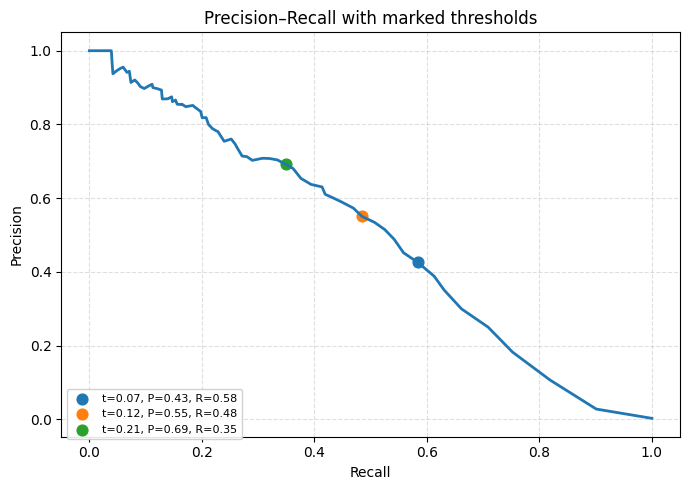

In [7]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(recall, precision, lw=2)

mark_thrs = [max_f2.thr.values[0], max_f1.thr.values[0], max_f05.thr.values[0]]

points = pr_at_thresholds(mark_thrs, thresholds, precision, recall)

handles = []
for t, p, r, i in points:
    plt.scatter(r, p, s=60, label=f"t={t:.2f}, P={p:.2f}, R={r:.2f}")
plt.legend(fontsize=8, loc="lower left")

ax.legend(
    fontsize=8, loc="lower left", bbox_to_anchor=(0, -0.02), ncol=1, framealpha=0.9
)
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Precision–Recall with marked thresholds")
ax.grid(True, ls="--", alpha=0.4)
plt.tight_layout()
plt.show()

## Confusion matrixes for thresholds

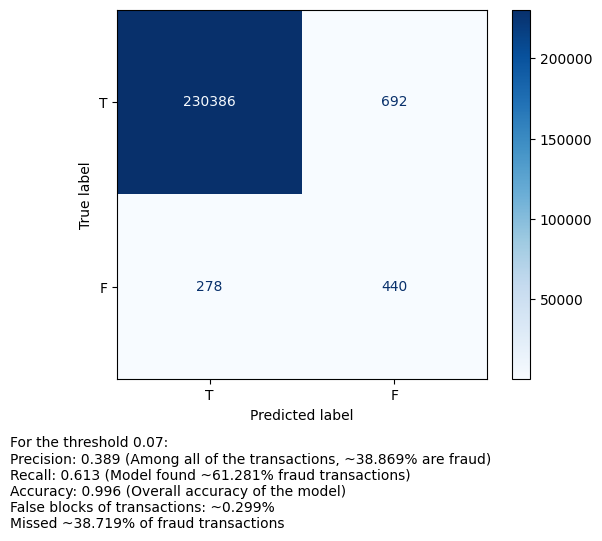

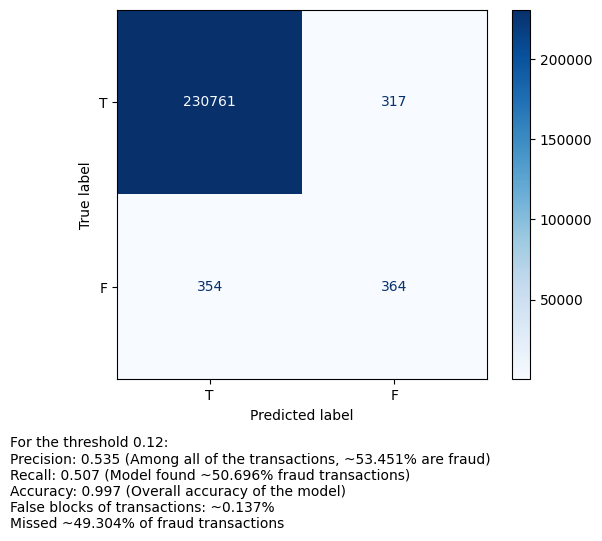

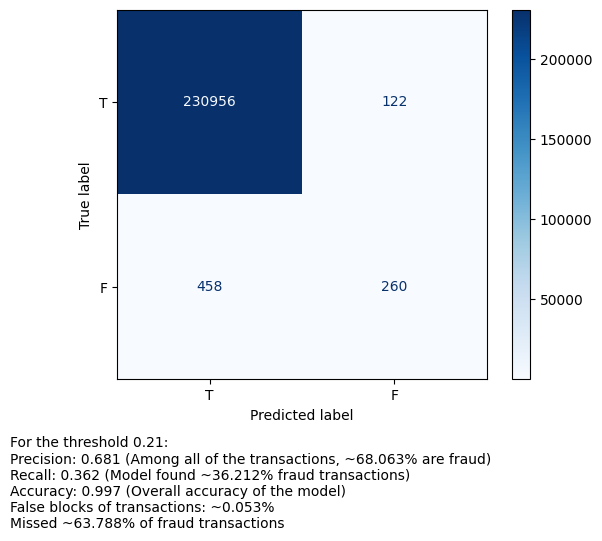

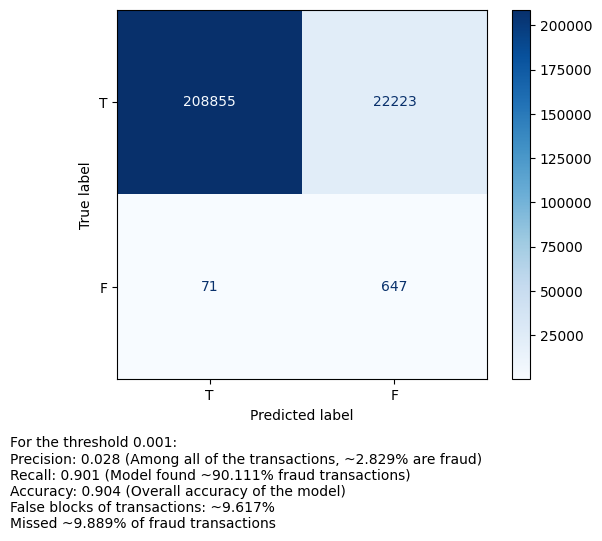

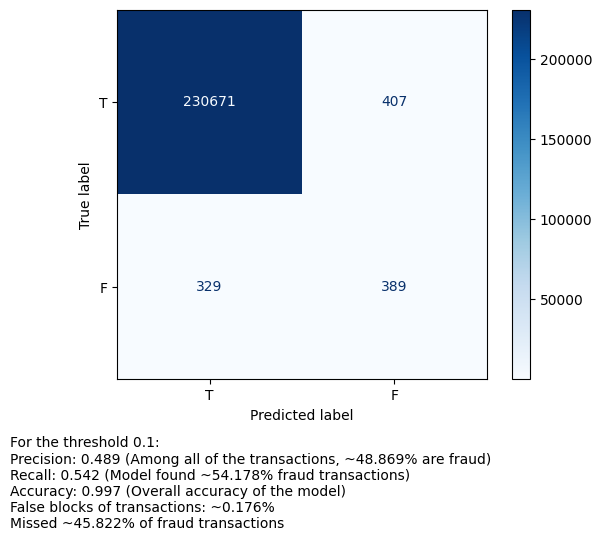

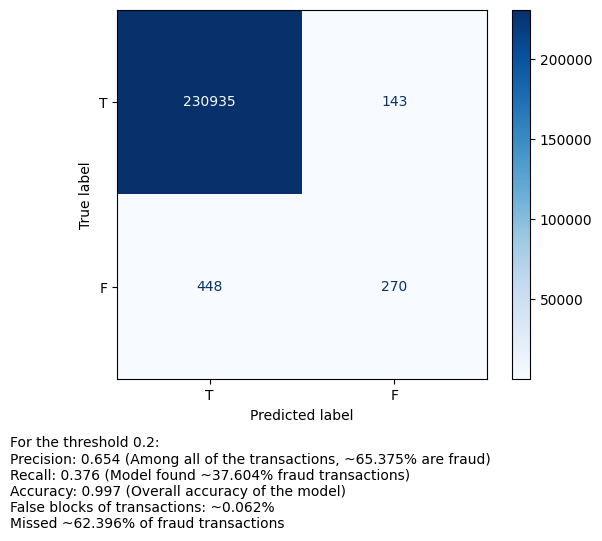

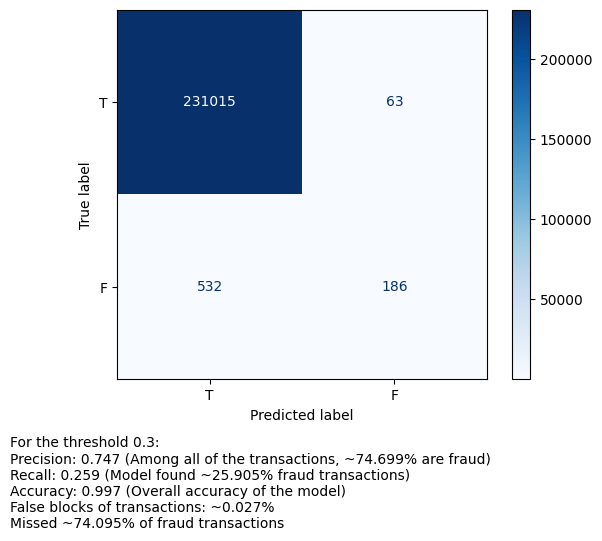

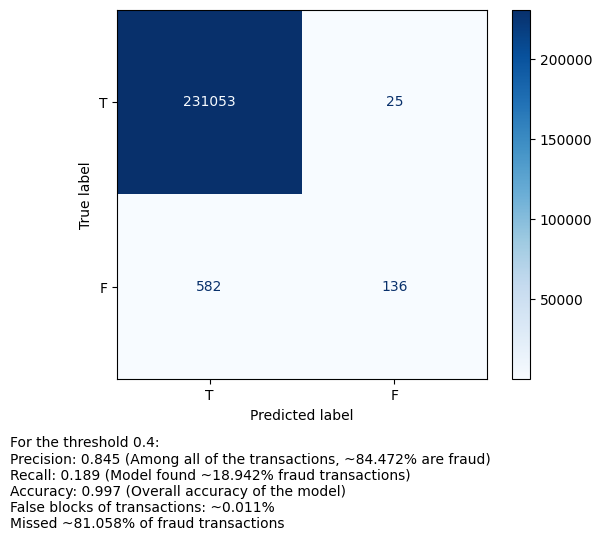

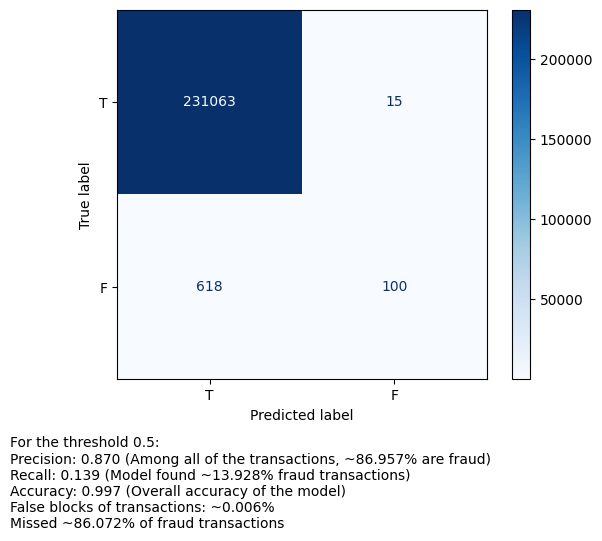

In [8]:
for thr in mark_thrs + [0.001, 0.1, 0.2, 0.3, 0.4, 0.5]:
    conf_matrix = cm_for_threshold(thr, y_rf_pred_proba, y_val)
    metrics = explain_confusion_matrix(conf_matrix, thr)
    disp = ConfusionMatrixDisplay(
        confusion_matrix=conf_matrix, display_labels=["T", "F"]
    )
    disp.plot(cmap="Blues")
    disp.figure_.text(0, -0.2, "\n".join(metrics))

## Tune model

* For tuning, use [optuna](https://github.com/optuna/optuna) library

In [9]:
import optuna


def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1200, step=100),
        "max_depth": trial.suggest_int("max_depth", 4, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 50),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 30),
        "max_features": trial.suggest_float("max_features", 0.2, 1.0),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
    }
    rf = RandomForestClassifier(
        class_weight="balanced_subsample", n_jobs=-1, random_state=42, **params
    )
    rf.fit(X_train[FEATURES], y_train)
    y_rf_pred_proba = rf.predict_proba(X_val[FEATURES])[:, 1]
    pr_auc = average_precision_score(y_val, y_rf_pred_proba)
    return pr_auc


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=3, show_progress_bar=True)

[I 2025-10-20 15:57:03,117] A new study created in memory with name: no-name-aa479318-9d35-45d9-80c6-a4fd51c40df5


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2025-10-20 16:12:54,978] Trial 0 finished with value: 0.4404751719524427 and parameters: {'n_estimators': 500, 'max_depth': 18, 'min_samples_split': 25, 'min_samples_leaf': 5, 'max_features': 0.8252317532175034, 'bootstrap': False}. Best is trial 0 with value: 0.4404751719524427.
[I 2025-10-20 16:20:56,456] Trial 1 finished with value: 0.4998998019716219 and parameters: {'n_estimators': 1200, 'max_depth': 13, 'min_samples_split': 29, 'min_samples_leaf': 22, 'max_features': 0.24268836626164988, 'bootstrap': True}. Best is trial 1 with value: 0.4998998019716219.
[I 2025-10-20 16:24:30,684] Trial 2 finished with value: 0.519284264540854 and parameters: {'n_estimators': 400, 'max_depth': 14, 'min_samples_split': 37, 'min_samples_leaf': 19, 'max_features': 0.31709800851716524, 'bootstrap': True}. Best is trial 2 with value: 0.519284264540854.


In [10]:
best_params = study.best_trial.params
best_ap = study.best_value
print("Best AP:", best_ap, "\nParams:", best_params)

Best AP: 0.519284264540854 
Params: {'n_estimators': 400, 'max_depth': 14, 'min_samples_split': 37, 'min_samples_leaf': 19, 'max_features': 0.31709800851716524, 'bootstrap': True}


## Train with best parameters

In [11]:
rf = RandomForestClassifier(
    class_weight="balanced_subsample",
    n_jobs=-1,
    random_state=42,
    **study.best_trial.params,
)
rf.fit(X_train[FEATURES], y_train)
y_rf_pred_proba = rf.predict_proba(X_test[FEATURES])[:, 1]
pr_auc = average_precision_score(y_test, y_rf_pred_proba)
roc_auc = roc_auc_score(y_test, y_rf_pred_proba)
pr_auc = average_precision_score(y_test, y_rf_pred_proba)

print(f"ROC AUC: {roc_auc:.3f}")
print(f"PR AUC: {pr_auc:.3f}")

ROC AUC: 0.989
PR AUC: 0.541


## Visualization

### Precision-recall curve

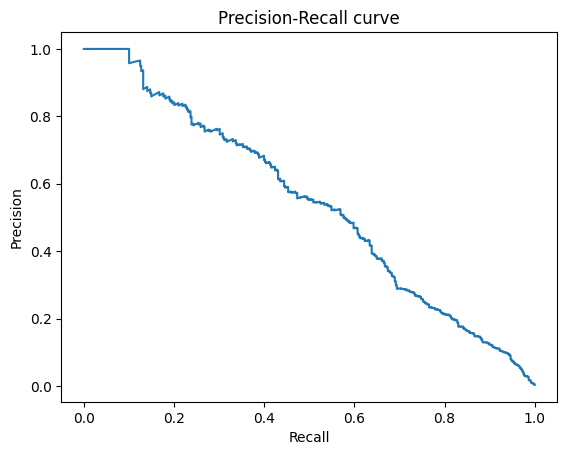

In [12]:
precision, recall, thresholds = precision_recall_curve(y_test, y_rf_pred_proba)
plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall curve")
plt.show()

## Threshold grid

In [13]:
grid_df = thresholds_grid(y_rf_pred_proba, y_test)
max_f1 = grid_df[grid_df["f1"] == grid_df["f1"].max()]
max_f05 = grid_df[grid_df["f0.5"] == grid_df["f0.5"].max()]
max_f2 = grid_df[grid_df["f2"] == grid_df["f2"].max()]
grid_df

,thr,precision,recall,f1,f0.5,f2,TP,FP,FN,TN
0,0.000,0.003227,1.000000,0.006432,0.004030,0.015927,448,138399,0,0
1,0.001,0.005015,1.000000,0.009980,0.006261,0.024582,448,88883,0,49516
2,0.002,0.005376,0.997768,0.010694,0.006711,0.026313,447,82701,1,55698
3,0.003,0.006654,0.997768,0.013219,0.008303,0.032404,447,66733,1,71666
4,0.004,0.007192,0.997768,0.014281,0.008974,0.034953,447,61704,1,76695
...,...,...,...,...,...,...,...,...,...,...
904,0.994,1.000000,0.031250,0.060606,0.138889,0.038760,14,0,434,138399
905,0.995,1.000000,0.020089,0.039387,0.092975,0.024986,9,0,439,138399
906,0.996,1.000000,0.013393,0.026432,0.063559,0.016685,6,0,442,138399
907,0.998,1.000000,0.008929,0.017699,0.043103,0.011136,4,0,444,138399


## Precision-recall curve with marked thresholds

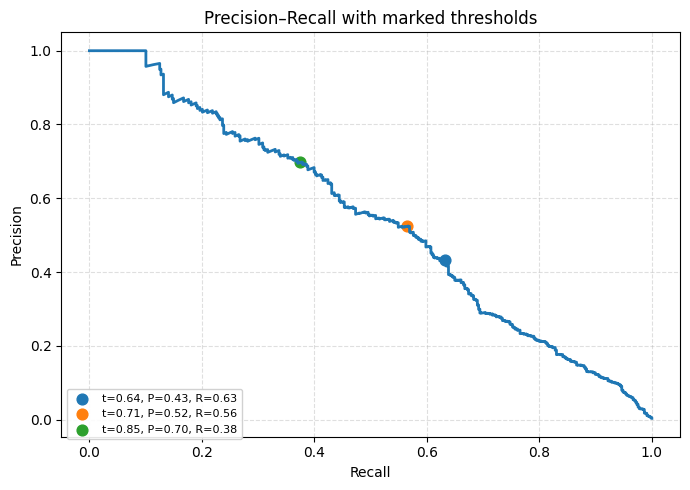

In [14]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(recall, precision, lw=2)

mark_thrs = [max_f2.thr.values[0], max_f1.thr.values[0], max_f05.thr.values[0]]

points = pr_at_thresholds(mark_thrs, thresholds, precision, recall)

handles = []
for t, p, r, i in points:
    plt.scatter(r, p, s=60, label=f"t={t:.2f}, P={p:.2f}, R={r:.2f}")
plt.legend(fontsize=8, loc="lower left")

ax.legend(
    fontsize=8, loc="lower left", bbox_to_anchor=(0, -0.02), ncol=1, framealpha=0.9
)
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Precision–Recall with marked thresholds")
ax.grid(True, ls="--", alpha=0.4)
plt.tight_layout()
plt.show()

## Confusion matrices for thresholds

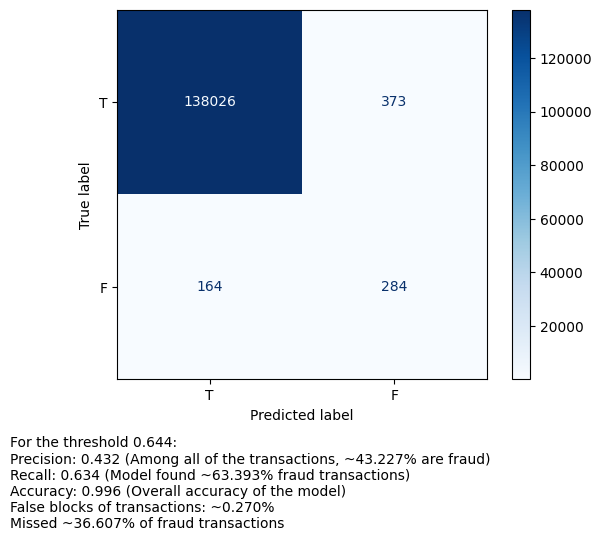

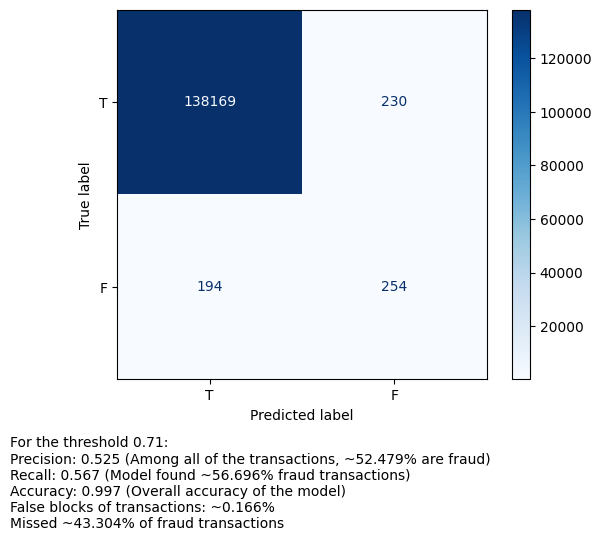

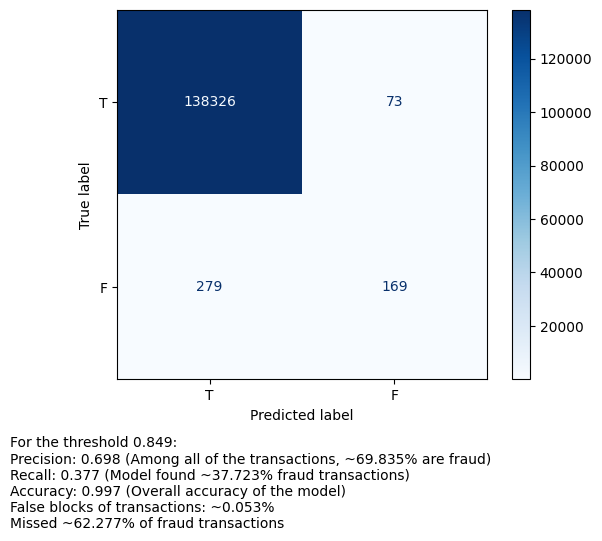

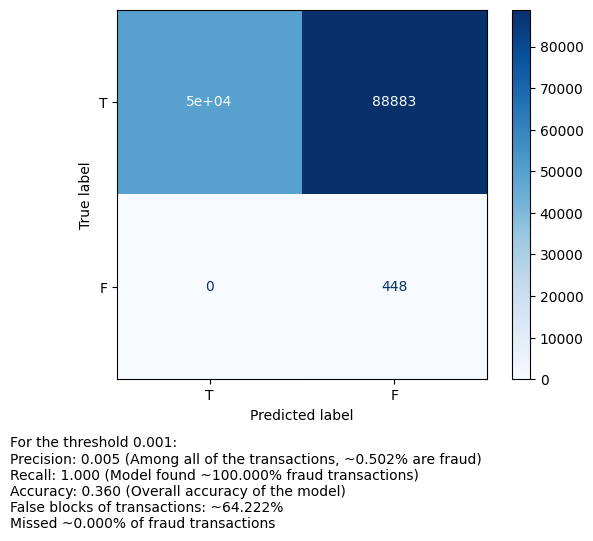

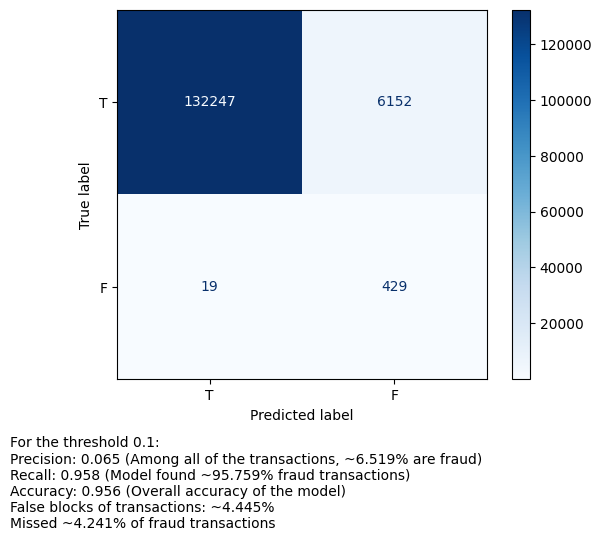

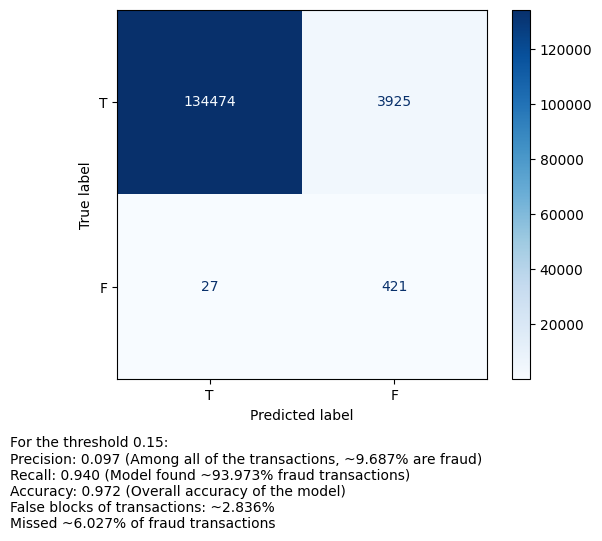

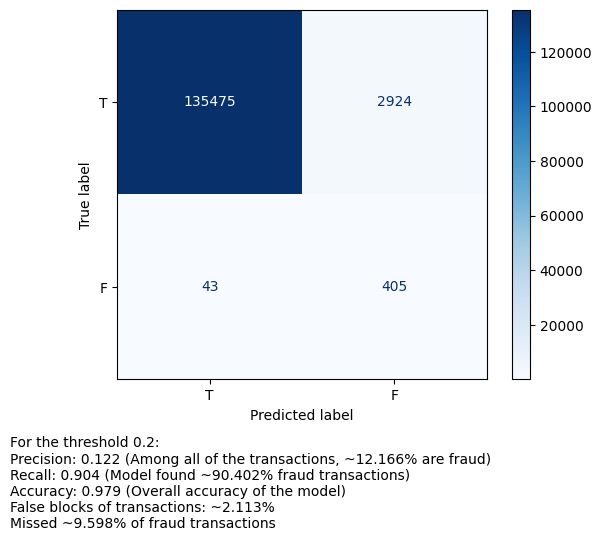

In [15]:
for thr in mark_thrs + [0.001, 0.1, 0.15, 0.2]:
    conf_matrix = cm_for_threshold(thr, y_rf_pred_proba, y_test)
    metrics = explain_confusion_matrix(conf_matrix, thr)
    disp = ConfusionMatrixDisplay(
        confusion_matrix=conf_matrix, display_labels=["T", "F"]
    )
    disp.plot(cmap="Blues")
    disp.figure_.text(0, -0.2, "\n".join(metrics))

## Observations

* Best model result is achived with threshold `0.1`

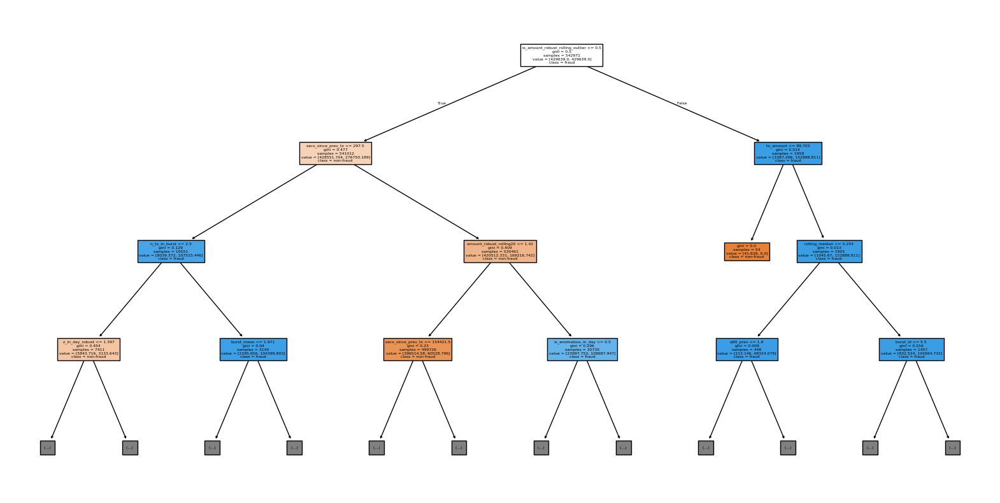

In [16]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

tree = rf.estimators_[0]

plt.figure(figsize=(20, 10))
plot_tree(
    tree,
    feature_names=FEATURES,
    class_names=["non-fraud", "fraud"],
    filled=True,
    max_depth=3,
)
plt.show()

## Feature importance

### Shap

#### Sample datasets


So it would not take a lot of time

In [ ]:
snap_params = study.best_trial.params
snap_params["n_estimators"] = 100
rf_snap = RandomForestClassifier(
    class_weight="balanced_subsample",
    n_jobs=-1,
    random_state=42,
    **snap_params,
)
rf_snap.fit(X_train[FEATURES], y_train)
y_rf_pred_proba_snap = rf_snap.predict_proba(X_test[FEATURES])[:, 1]

sample_frac = 0.1
X_s = X_val[FEATURES].sample(n=min(5000, len(X_val)), random_state=42, weights=None)
y_s = y_val.loc[X_s.index]

In [ ]:
explainer = shap.TreeExplainer(
    rf_snap, feature_perturbation="tree_path_dependent", model_output="raw"
)
shap_vals = explainer.shap_values(X_s[FEATURES], check_additivity=False)

In [ ]:
sv = shap_vals
if isinstance(sv, list):
    sv = sv[1]

assert sv.shape[1] == X_s.shape[1], (
    f"SHAP features {sv.shape[1]} != X columns {X_s.shape[1]}"
)

if shap_vals.ndim == 3:
    pos_idx = int(np.where(rf.classes_ == 1)[0][0])
    vals = shap_vals[:, :, pos_idx]

mean_abs = np.abs(vals).mean(axis=0)
shap_mean = pd.DataFrame({"feature": FEATURES, "mean_abs_shap": mean_abs}).sort_values(
    "mean_abs_shap", ascending=False
)
shap_mean

,feature,mean_abs_shap
23,amount_robust_rolling20,0.119585
13,n_tx_in_burst,0.093186
11,secs_since_prev_tx,0.057822
35,z_in_day_robust,0.046996
10,tx_amount_log_deviates,0.037744
24,is_amount_robust_rolling_outlier,0.036290
16,n_trx_per_burst_deviates,0.023089
22,iqr,0.020986
0,tx_amount,0.014024
2,tx_amount_log,0.013252


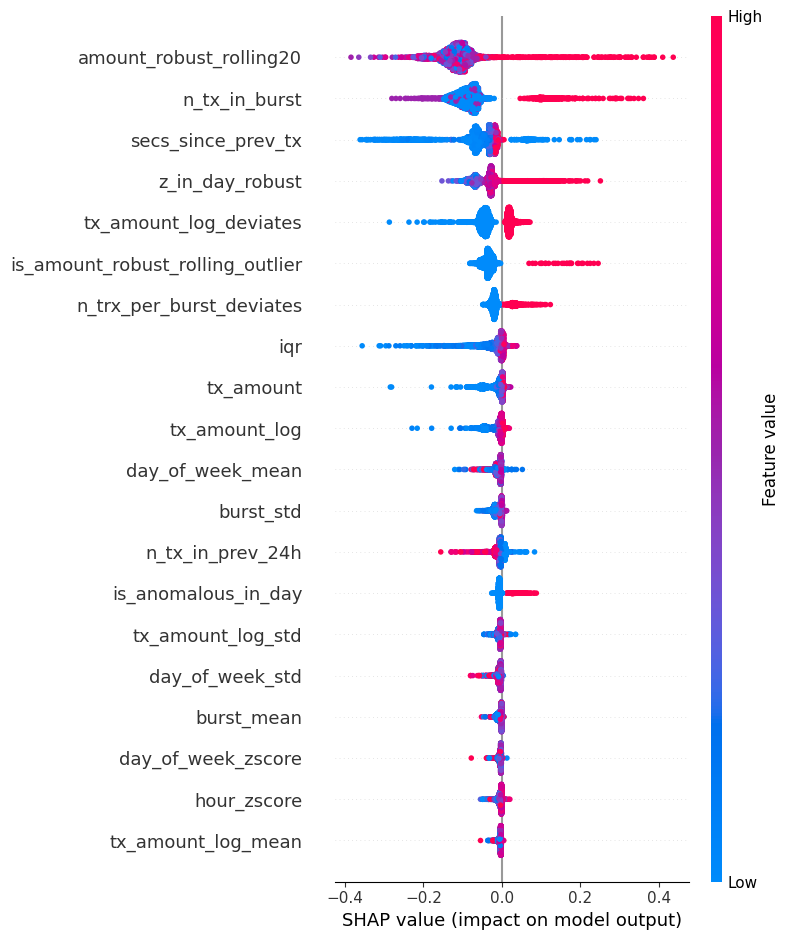

In [ ]:
shap.summary_plot(vals, X_s, show=False)
plt.tight_layout()
plt.show()

## dtreeviz

In [ ]:
X_arr = X_train[FEATURES].to_numpy()
y_arr = np.asarray(y_train).ravel().astype(int)

classes = {0: "non-fraud", 1: "fraud"}

tree = rf_snap.estimators_[0]

viz = dtreeviz.model(
    tree,
    X_arr,
    y_arr,
    feature_names=[str(f) for f in FEATURES],
    target_name="fraud",
    class_names=classes,
)

In [74]:
rf_view = viz.view(x=X_arr[0])
rf_view_lr = viz.view(x=X_arr[0], orientation="LR")
rf_view_lr.save(os.path.join(INTERIM_DATA, "random_forest_visual_lr.svg"))
rf_view.save(os.path.join(INTERIM_DATA, "random_forest_visual.svg"))
rf_view

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x

## Save model

In [ ]:
joblib.dump(rf, os.path.join(DATA, "models/random_forest.pkl"))

['/Users/vadim.sokoltsov/learning/fraud_transactions_tech_assignment/data/models/random_forest.pkl']

### Save thresholds

In [ ]:
save_model_thresholds(os.path.join(DATA, "models/thresholds.yaml"), {"random_forest": 0.1})